# 인물사진 만들기 배경합성하기 모델 선언

In [1]:
# 필요한 모듈들을 import

import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

In [2]:
# DeepLab 모델을 PixelLib를 이용하면 편하게 사용 할 수 있다.
# PixelLib에서 제공해 주는 모델을 다운로드
# 원래는 DeepLab 모델을 직접 정의해서 사용해야 한다. (여유가 있다면 직접 사용해 볼 예정)

# 모델을 저장할 경로와 모델명 
model_dir = os.getenv('HOME')+'/aiffel/workplace/[E-07]_Portrait/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

# 다운로드 받을 PixelLib이 제공하는 DeepLab 모델의 url
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

# 해당 url로 부터 모델을 다운로드해서 지정한 경로로 저장한다.
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/workplace/[E-07]_Portrait/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7fbf58b47370>)

In [3]:
# 세그멘테이션 모델 생성
# semantic_segmentation()의 객체인 model 객체 생성
# 다운로드 받은 DeepLab 모델을 불러온다.

model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [4]:
# Pascalvoc 데이터로 학습된 모델을 사용하고 있다. 
# PASCAL VOC 데이터셋의 라벨의 종류는 다음과 같다.  
# 사람 검출을 위해서 우리는 15 person을 사용할 것이다.

LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

# 아웃 포커싱 적용된 인물사진

(2268, 4032, 3)


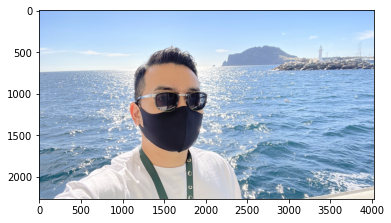

In [5]:
# 원본 이미지 불러오기 및 이미지 속성 확인

img_path_my = os.getenv('HOME')+'/aiffel/workplace/[E-07]_Portrait/human_segmentation/images/my_image2.png'  
img_orig_my = cv2.imread(img_path_my) 

print(img_orig_my.shape)
plt.imshow(cv2.cvtColor(img_orig_my, cv2.COLOR_BGR2RGB))
plt.show()

In [6]:
# DeepLab 모델에 이미지를 입력한다.

segvalues_my, output_my = model.segmentAsPascalvoc(img_path_my)

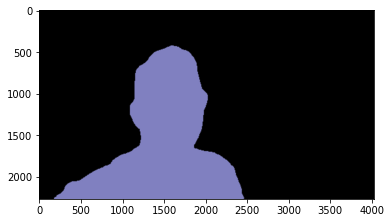

In [7]:
# 모델을 통해 출력된 값 output을 확인 

plt.imshow(output_my)


In [8]:
# segvalues의 구성을 확인

segvalues_my

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [9]:
# 배경(background)과 사람(person)으로 나뉜것을 확인 할 수 있다. 

for class_id in segvalues_my['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [10]:
# class에 따라서 사용되는 색상을 확인해보자
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

컬러맵 결과로 나온 [192, 128, 128] 값은 BGR 순서이다.  
왜? OpenCV 이기 때문에, 그래서 우리가 이것을 제대로 사용하기 위해서는 RGB 순으로 변경해줘야 한다.  
그러므로 우리는 [128, 128, 192] 이렇게 변경된 데이터를 사용하게 될것이다.

In [11]:
# 사람(person)을 나타내는 16번째(index 값은15) 컬러는 다음과 같다.
# 이 값은 BGR로 표현되어 있으므로 실제 사용을 위해서는 RGB로 변경해야 한다.

colormap[15]

array([192, 128, 128])

In [12]:
# 색을 변경해주자.

seg_color = (128,128,192)

(2268, 4032)


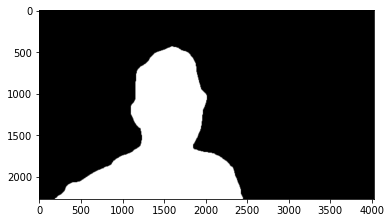

In [13]:
# seg_color로만 이루어진 마스크
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다

seg_map_my = np.all(output_my==seg_color, axis=-1)
print(seg_map_my.shape)
plt.imshow(seg_map_my, cmap='gray')
plt.show()

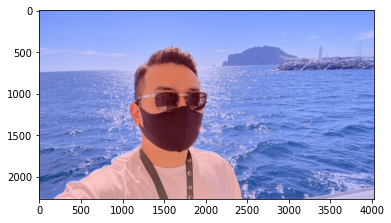

In [15]:
# 원래의 이미지와 비교해서 세그멘테이션 정도 확인해 보기

img_show = img_orig_my.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask1 = seg_map_my.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask1 = cv2.applyColorMap(img_mask1, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.8, color_mask1, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

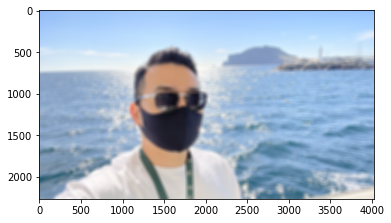

In [16]:
# blur() 함수를 이용해서 배경을 흐리게 만듭니다.
# 배경흐림을 확실하게 확인하기 위해서 blurring kernel size를 50, 50으로 변경
# 숫자가 커지면 배경이 더 흐려진다.

img_orig_my_blur = cv2.blur(img_orig_my, (50,50))  
plt.imshow(cv2.cvtColor(img_orig_my_blur, cv2.COLOR_BGR2RGB))
plt.show()

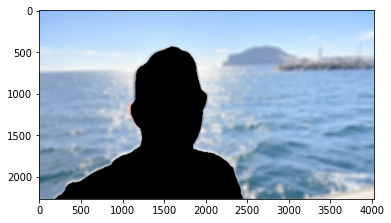

In [18]:
# 흐려진 이미지에서 세그멘테이션 마스크를 이용해서 배경만 추출

img_mask1_color = cv2.cvtColor(img_mask1, cv2.COLOR_GRAY2BGR)
img_bg_mask1 = cv2.bitwise_not(img_mask1_color)
img_bg_blur1 = cv2.bitwise_and(img_orig_my_blur, img_bg_mask1)
plt.imshow(cv2.cvtColor(img_bg_blur1, cv2.COLOR_BGR2RGB))
plt.show()

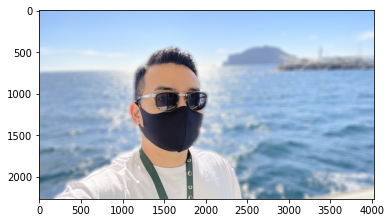

In [19]:
# 흐린 배경과 원본 영상 합성

img_concat1 = np.where(img_mask1_color==255, img_orig_my, img_bg_blur1)
plt.imshow(cv2.cvtColor(img_concat1, cv2.COLOR_BGR2RGB))
plt.show()



In [21]:
# 합성된 이미지 저장

img_path = os.getenv('HOME')+'/aiffel/workplace/[E-07]_Portrait/human_segmentation/images/converted_image_my.png'
cv2.imwrite(img_path, img_concat1)

True

# 고양이 이미지

(800, 600, 3)


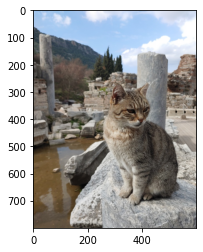

In [22]:
# 이미지 불러오기 

img_path_cat = os.getenv('HOME')+'/aiffel/workplace/[E-07]_Portrait/human_segmentation/images/cat.jpeg'  
img_orig_cat = cv2.imread(img_path_cat) 

print(img_orig_cat.shape)
plt.imshow(cv2.cvtColor(img_orig_cat, cv2.COLOR_BGR2RGB))
plt.show()

In [23]:
# DeepLab 모델에 이미지를 입력한다.

segvalues_cat, output_cat = model.segmentAsPascalvoc(img_path_cat)

In [24]:
# segvalues의 구성을 확인

segvalues_cat

{'class_ids': array([0, 8]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [25]:
# 배경(background)과 고양이(cat)으로 나뉜것을 확인 할 수 있다. 

for class_id in segvalues_cat['class_ids']:
    print(LABEL_NAMES[class_id])

background
cat


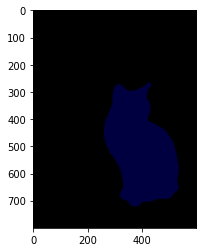

In [26]:
# 모델을 통해 출력된 값 output을 확인 

plt.imshow(output_cat)
plt.show()

In [27]:
# 고양이(cat)을 나타내는 9번째(index 값은8) 컬러는 다음과 같다.

colormap[8]

array([64,  0,  0])

In [28]:
# 색을 변경해주자.

seg_color = (0,0,64)

(800, 600)


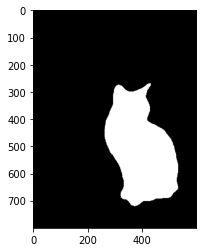

In [29]:
# seg_color로만 이루어진 마스크
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다

seg_map_cat = np.all(output_cat==seg_color, axis=-1)
print(seg_map_cat.shape)
plt.imshow(seg_map_cat, cmap='gray')
plt.show()

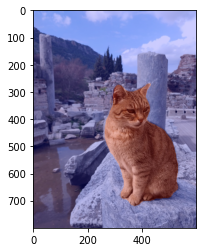

In [30]:
# 원래의 이미지와 비교해서 세그멘테이션 정도 확인해 보기

img_show = img_orig_cat.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask_cat = seg_map_cat.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask_cat = cv2.applyColorMap(img_mask_cat, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.8, color_mask_cat, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

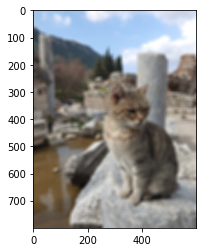

In [31]:
# blur() 함수를 이용해서 배경을 흐리게 만듭니다.
# 배경흐림을 확실하게 확인하기 위해서 blurring kernel size를 50, 50으로 변경
# 숫자가 커지면 배경이 더 흐려진다.

img_orig_blur_cat = cv2.blur(img_orig_cat, (15,15))  
plt.imshow(cv2.cvtColor(img_orig_blur_cat, cv2.COLOR_BGR2RGB))
plt.show()

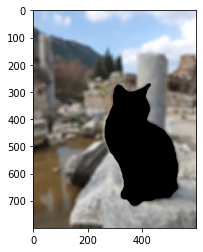

In [32]:
# 흐려진 이미지에서 세그멘테이션 마스크를 이용해서 배경만 추출

img_mask2_color = cv2.cvtColor(img_mask_cat, cv2.COLOR_GRAY2BGR)
img_bg_mask2 = cv2.bitwise_not(img_mask2_color)
img_bg_blur2 = cv2.bitwise_and(img_orig_blur_cat, img_bg_mask2)
plt.imshow(cv2.cvtColor(img_bg_blur2, cv2.COLOR_BGR2RGB))
plt.show()

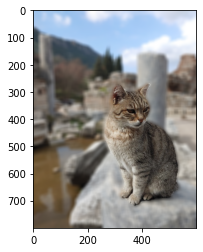

In [35]:
# 흐린 배경과 원본 영상 합성

img_concat2 = np.where(img_mask2_color==255, img_orig_cat, img_bg_blur2)
plt.imshow(cv2.cvtColor(img_concat2, cv2.COLOR_BGR2RGB))
plt.show()

In [174]:
# 합성된 이미지 저장

img_path = os.getenv('HOME')+'/aiffel/workplace/[E-07]_Portrait/human_segmentation/images/converted_image_cat.png'
cv2.imwrite(img_path, img_concat2)

True

# 크로마키 합성

(2268, 4032, 3)


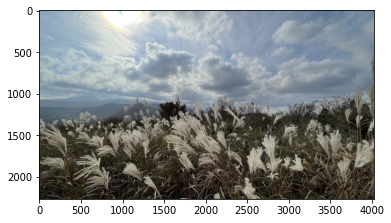

In [36]:
# 크로마키 배경사진 불러오기 (인물 영상과 동일한 사이즈 사용)

img_path_chromakey = os.getenv('HOME')+'/aiffel/workplace/[E-07]_Portrait/human_segmentation/images/chromakey.png'  
img_chromakey_bg = cv2.imread(img_path_chromakey)

print(img_chromakey_bg.shape)
plt.imshow(cv2.cvtColor(img_chromakey_bg, cv2.COLOR_BGR2RGB))
plt.show()

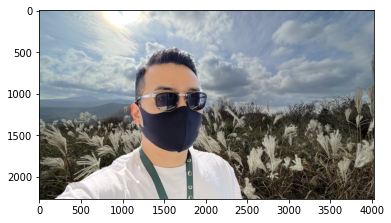

In [39]:
# 앞선 챕터에서 불러들인 내 사진과 합성

img_concat3 = np.where(img_mask1_color==255, img_orig_my, img_chromakey_bg)
plt.imshow(cv2.cvtColor(img_concat3, cv2.COLOR_BGR2RGB))
plt.show()

In [41]:
# 합성된 이미지 저장

img_path = os.getenv('HOME')+'/aiffel/workplace/[E-07]_Portrait/human_segmentation/images/converted_chromakey.png'
cv2.imwrite(img_path, img_concat3)

True

# 이미지 비교 1

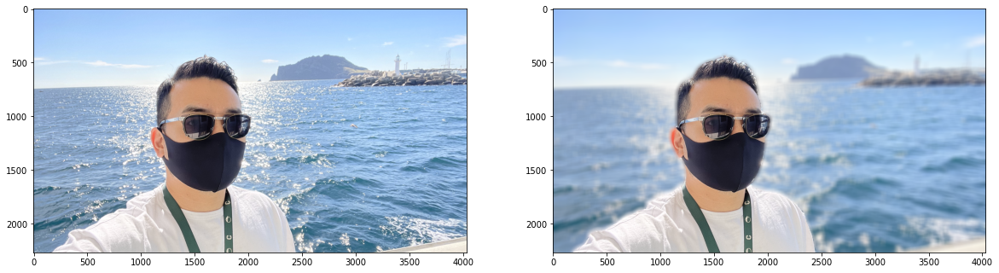

In [45]:
fig = plt.figure(figsize=(20, 15))

ax = plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img_orig_my, cv2.COLOR_BGR2RGB))

ax = plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_concat1, cv2.COLOR_BGR2RGB))

# 이미지 비교 2

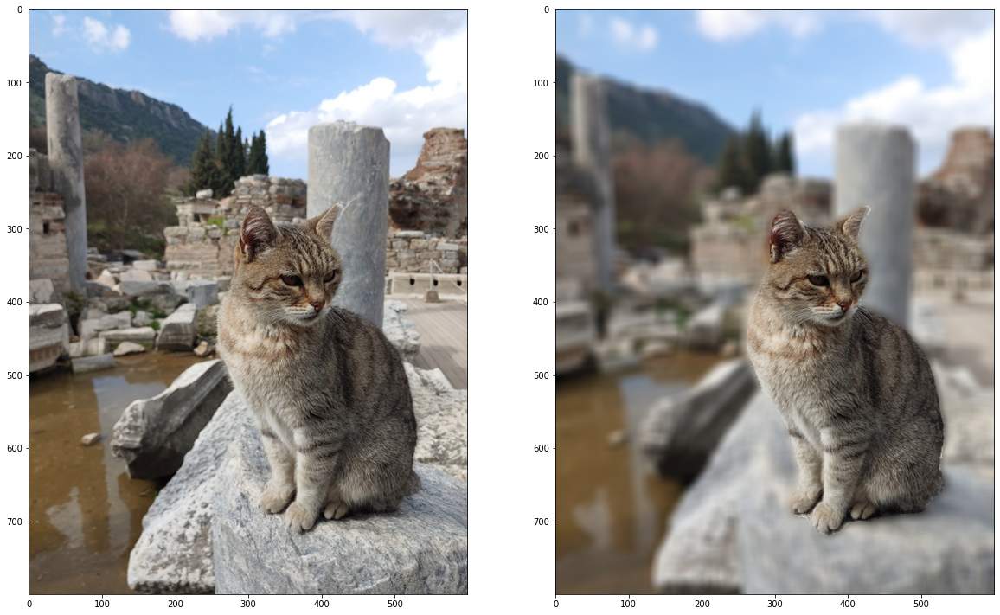

In [46]:
fig = plt.figure(figsize=(20, 15))

ax = plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img_orig_cat, cv2.COLOR_BGR2RGB))

ax = plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_concat2, cv2.COLOR_BGR2RGB))

# 이미지 비교 3

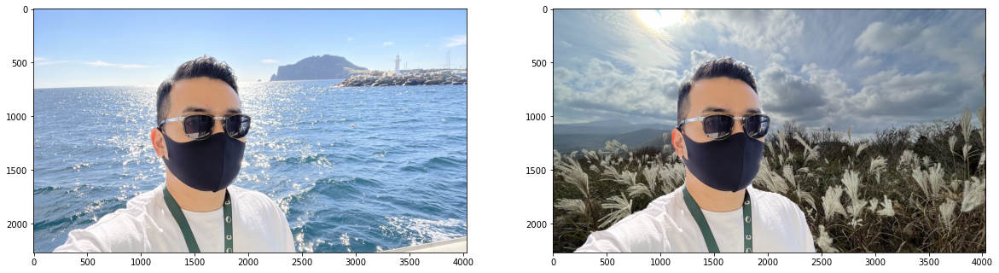

In [47]:
fig = plt.figure(figsize=(20, 15))

ax = plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img_orig_my, cv2.COLOR_BGR2RGB))

ax = plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_concat3, cv2.COLOR_BGR2RGB))

# 문제점 분석

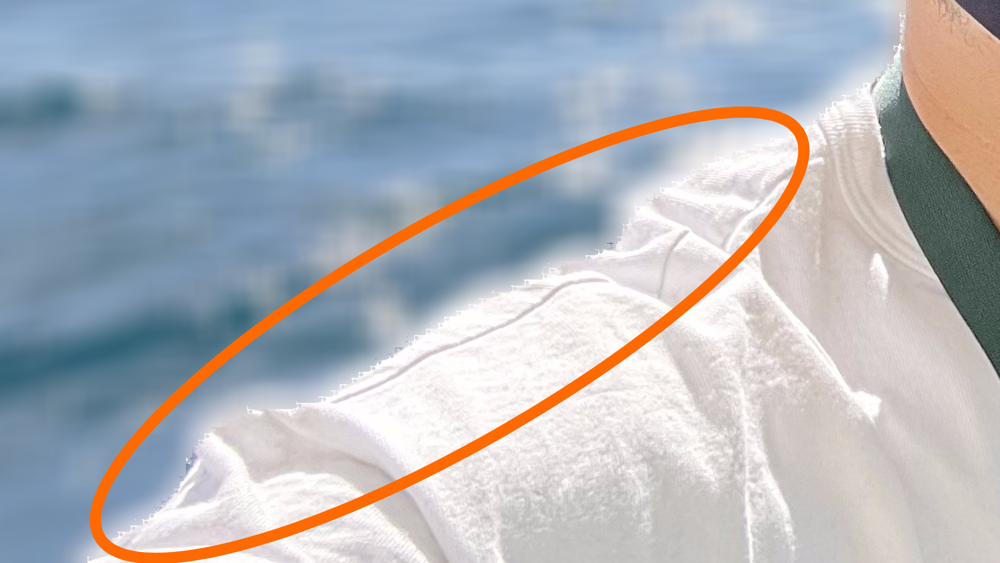

사진에서 보는 것 처럼 옷과 배경의 경계면이 날카롭게 뜯겨져 나간 것을 확인 할 수 있다.

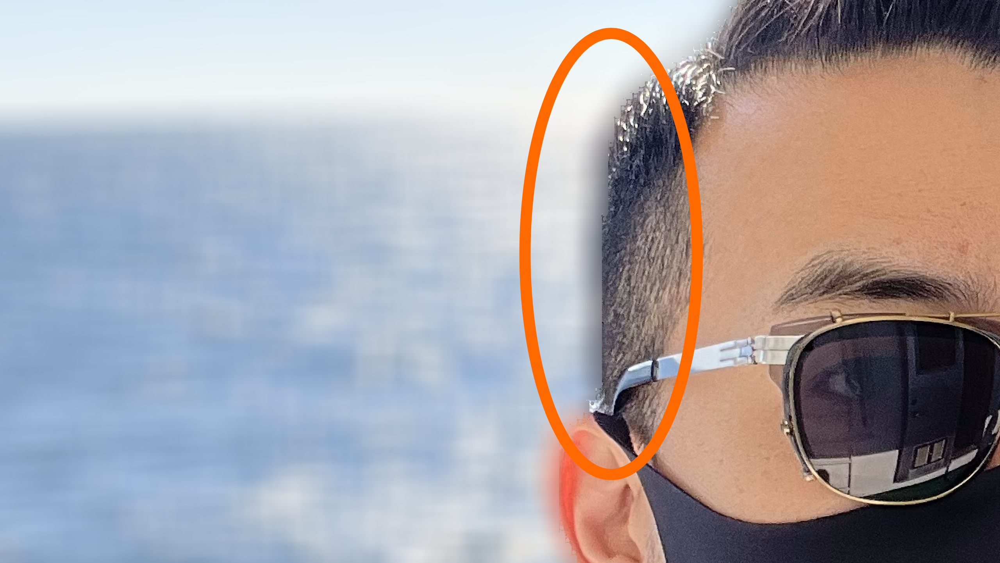

위의 경우와는 다르게 배경과 인물의 경계면이 부자연스럽게 나뉘면서 마치 그림자가 진것 처럼 블러링 처리 된 것을 확인할 수 있다.  
원본과 비교해 보면 블러링 처리된 부분이 머리부분임에도 불구하고 제대로 나뉘지 않고 블러링 처리가 되어 버렸다.  
아마도 이 부분은 블러가 처리 될때 범위설정에 의해서 블러링 처리 하지 말아야 할 부분도 블러링 해 버리는 것 때문이 아닌가 생각된다.

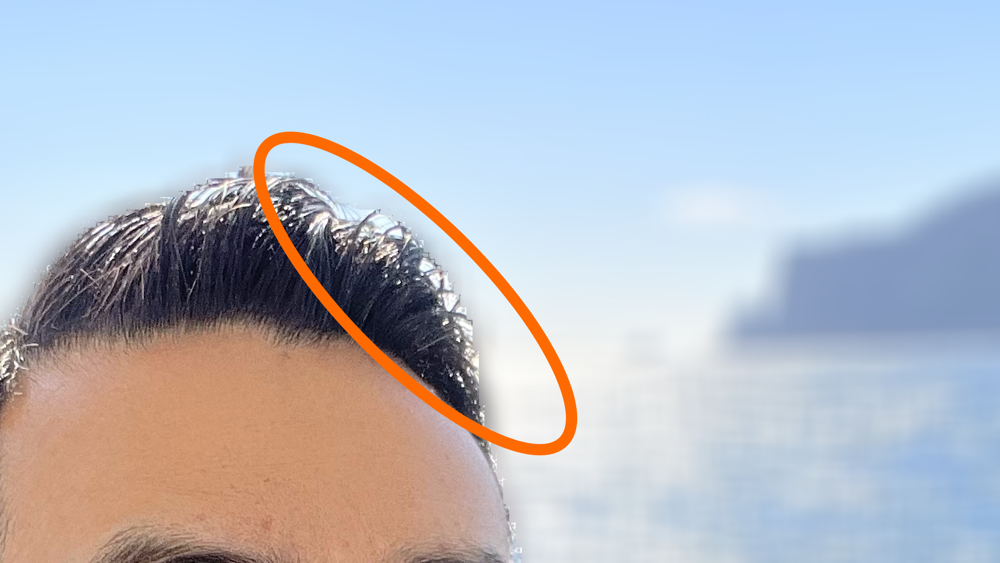

머리카락 틈새들이 제대로 블러링 처리가 되지 않은 것을 확인할 수 있다.  
아마도 세그멘테이션 될때 머리카락 하나하나 분리하지 못하고 저 영역을 모두 머리로 인식했을 가능성이 높다고 생각된다.

# 문제 해결 방법

만약 우리가 depth정보를 확인할 수 있다면 해당 depth를 사용해서 좀 더 정밀한 Segmentation이 가능 하다고 생각된다. 
일단 인물고 배경 두가지만 놓고 보았을 경우 분명 두 개의 objtct는 depth 차이가 분명할 것이다. 
특히 object 간의 경계가 변하는 지점에서는 이러한 depth의 변화량이 급격하게 변화될 것으로 생각된다. 
우리는 이러한 depth의 급격한 변화를 감지해서 segmentation에 적용한다면 좀 더 정밀하게 segmentation을 할 수 있을 것으로 생각된다. 

블러처리시 발생하는 경계 주변의 흐려짐 현상은  mask가 처리된 부분의 촤표들을 이용해서 해당 좌표에 플래그를 on 하고 블러 적용할 시 flag가 on된 (mask된) 부분은 제외하도록 알고리즘을 수정한다면 성능향상이 가능 할 것으로 생각된다.

경계가 날카로운 부분 같은 경우에는 블러처리된 이미지와 원본이미지를 합치는 과정에서 경계면처리시 블러링을 추가로 진행한다던가 하는 추가적인 조치를 통해서 개선 할 수 있을 것으로 생각된다.

# 회고

이번 프로젝트는 별다르게 어렵게 느껴지거나 힘들었던 부분은 없는 것 같다.  
포토샵이나 영상편집 프로그램을 사용해서 마스크를 많이 사용해 보았는데 이번 프로젝트를 통해서 마스크를 어떻게 적용하는지 알고리즘상으로 확인할 수 있는 기회가 되었다.  
여전히 컴퓨터가 사물을 인식하는 방법과 사람이 인식하는 방법간에 너무도 차이가 커 보인다. 사람이 쉽게 인식하고 구분해내는 것들을 컴퓨터는 매우 어렵고 복잡하게 하는 것 같다고 생각이 든다.